In [10]:
import os
import cv2
import numpy as np
import glob
import PIL.Image as Image
import pandas as pd
# pip install torchsummary
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
from torchvision import models
import torch.nn.functional as F
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision import models
#from torchsummary import summary
import torch.optim as optim
from time import time
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
from IPython.display import clear_output
import torchvision.transforms.functional as TF
from draw_segmentation_masks import draw_segmentation_masks
from torchvision.ops import masks_to_boxes
from torchvision.utils import draw_bounding_boxes
from UNet import UNet
from utils import LoadDataSet, plot_img_and_hist
from copy import deepcopy
plt.rcParams['figure.figsize'] = [36, 18]
plt.rcParams['font.size'] = 16
from skimage.io import imread
from skimage import data, io, img_as_float, exposure

In [170]:
im = imread("images/wt basal 008.tif", plugin="tifffile")

/zhome/7b/f/153842/.local/lib/python3.8/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


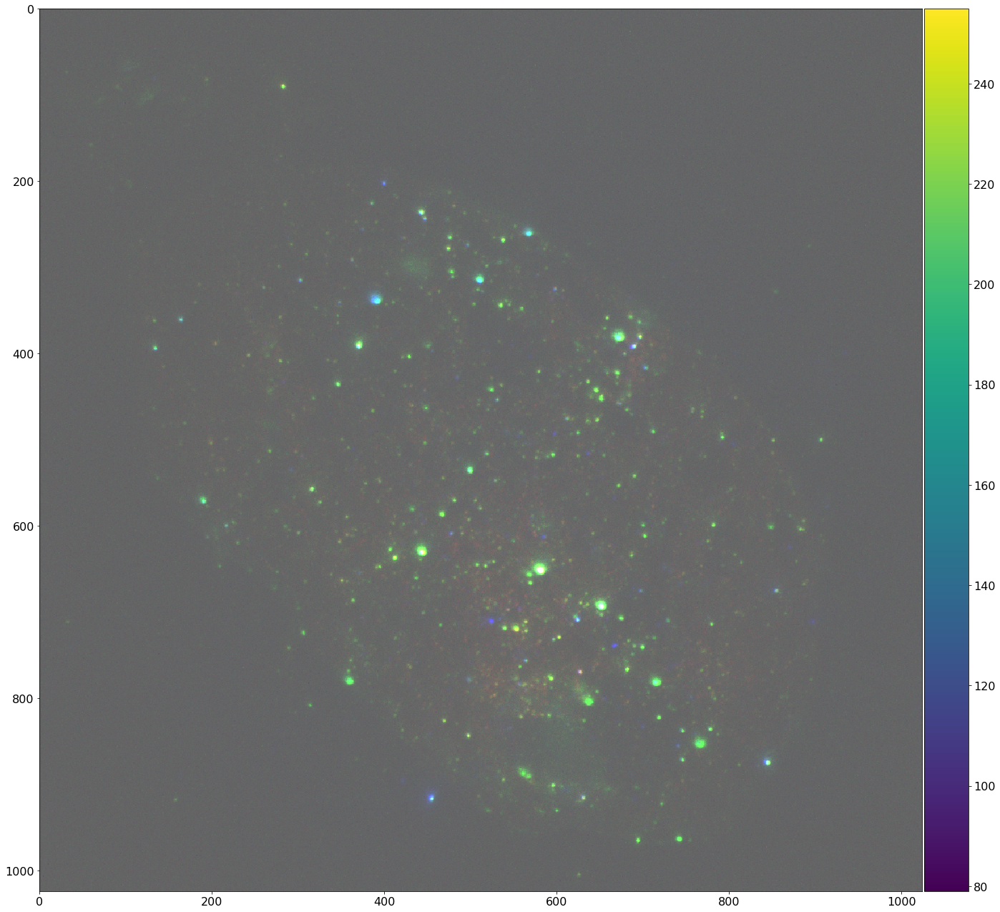

In [171]:
im[im>255]=255
io.imshow(im)

In [316]:
def plot_equalizations(img, clip_limit=0.03):

    # Adaptive Equalization
    img_adapteq = exposure.equalize_adapthist(img, clip_limit=clip_limit)

    # Display results
    fig = plt.figure(figsize=(18, 18))
    axes = np.zeros((2, 2), dtype=np.object)
    axes[0, 0] = fig.add_subplot(2, 2, 1)
    for i in range(1, 2):
        axes[0, i] = fig.add_subplot(2, 2, 1+i, sharex=axes[0,0], sharey=axes[0,0])
    for i in range(0, 2):
        axes[1, i] = fig.add_subplot(2, 2, 3+i)

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
    ax_img.set_title('Low contrast image')

    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_ylabel('Number of pixels')
    ax_hist.set_yticks(np.linspace(0, y_max, 5))

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 1])
    ax_img.set_title('Adaptive equalization')

    ax_cdf.set_ylabel('Fraction of total intensity')
    ax_cdf.set_yticks(np.linspace(0, 1, 5))

    # prevent overlap of y-axis labels
    fig.tight_layout()
    plt.show()
    
    return img.astype(np.uint8), img_adapteq.astype(np.uint8)

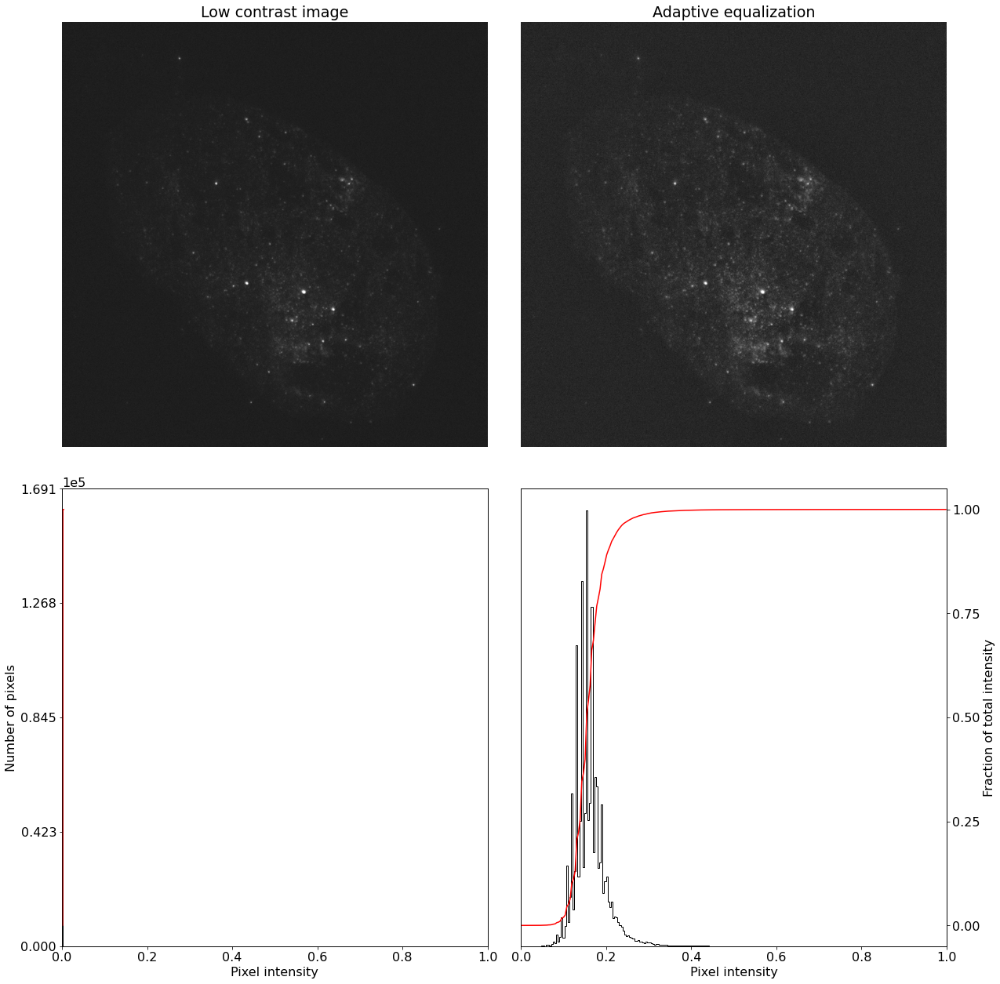

In [317]:
# Load channel
img = im[:,:,0]
R_chan, R_chan_adapteq = plot_equalizations(img, clip_limit=0.01)

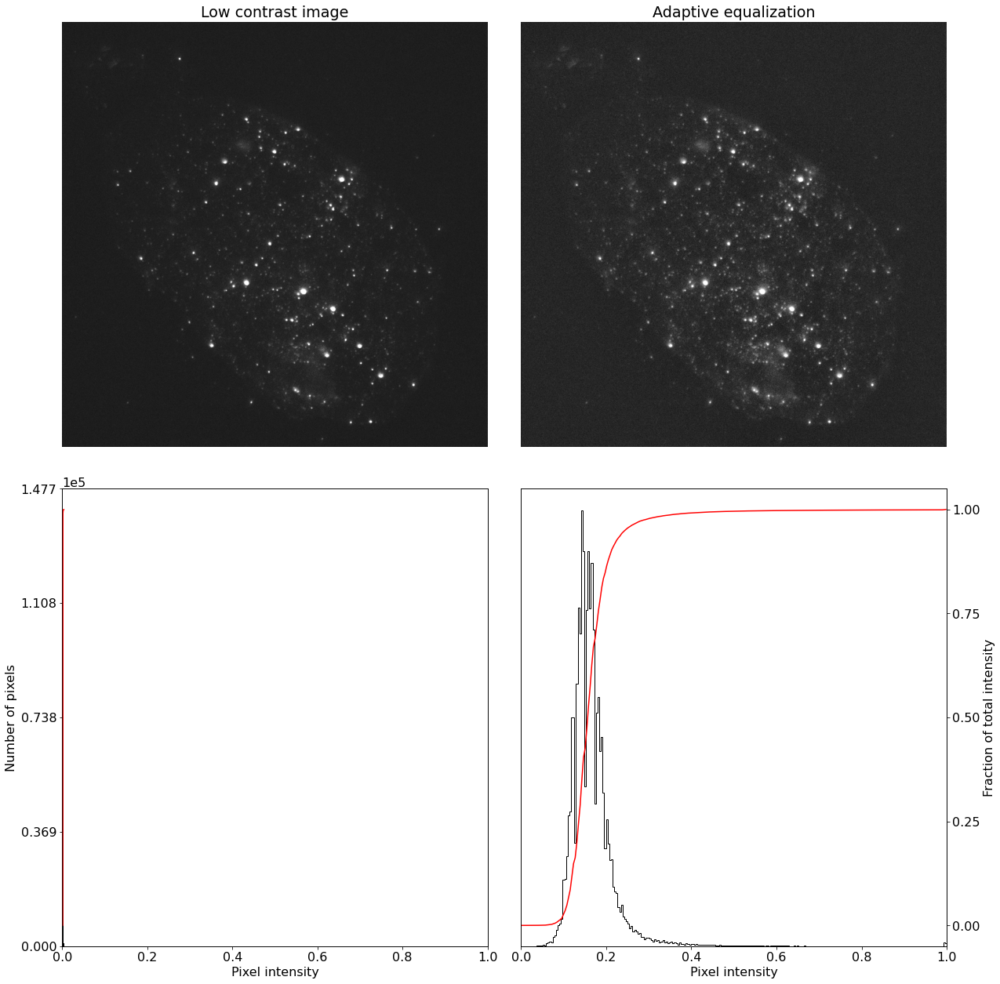

In [318]:
# Load channel
img = im[:,:,1]
G_chan, G_chan_adapteq = plot_equalizations(img, clip_limit=0.01)

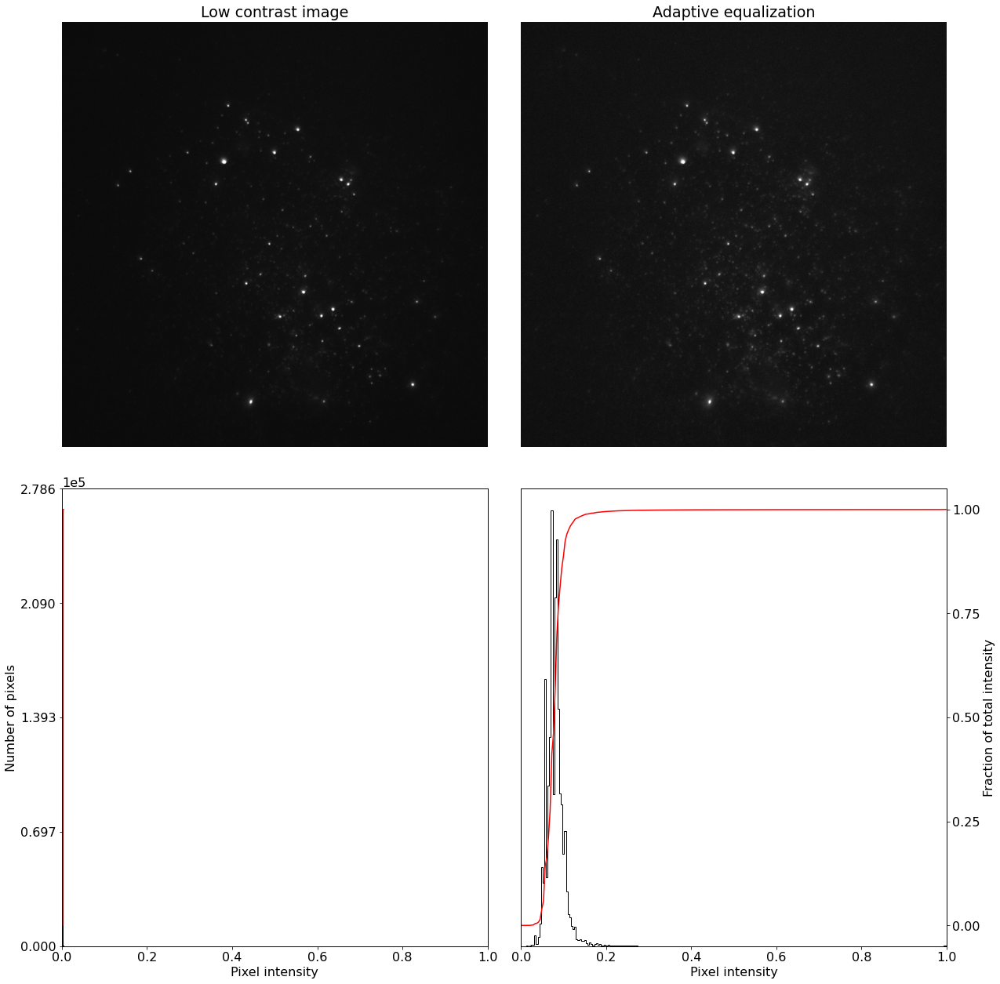

In [319]:
# Load channel
img = im[:,:,2]
B_chan, B_chan_adapteq = plot_equalizations(img, clip_limit=0.01)

# Mask extraction

In [383]:
## Select image: R_chan, R_chan_adapteq, G_chan, 

def extract_masks(image, sensitivity, dilation=True, plot=False):
    ## options
    dilation=True
    ##

    size = image.shape[1]
    #imgray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(image, sensitivity, 255, 0)
    ## Optional dilation
    if dilation:
        kernal = np.ones((2, 2), np.uint8)
        dilation = cv2.dilate(thresh, kernal, iterations=1)
        final_mask = dilation
    else:
        final_mask = thresh
    ## Find contours

    contours, hierarchy = cv2.findContours(
        final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    objects = str(len(contours))
    mask = np.zeros(final_mask.shape, dtype=np.int16)
    all_contours = cv2.drawContours(deepcopy(mask) , contours, -1, 255,-1)

    if plot:
        plt.subplot(1,2,1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Input image')
        plt.axis('off')

        plt.subplot(1,2,2)
        plt.imshow(all_contours, cmap="gray",alpha=1)
        plt.title(f"Segmented mask")
        plt.axis('off')
        plt.show()
    return mask, contours, hierarchy
    


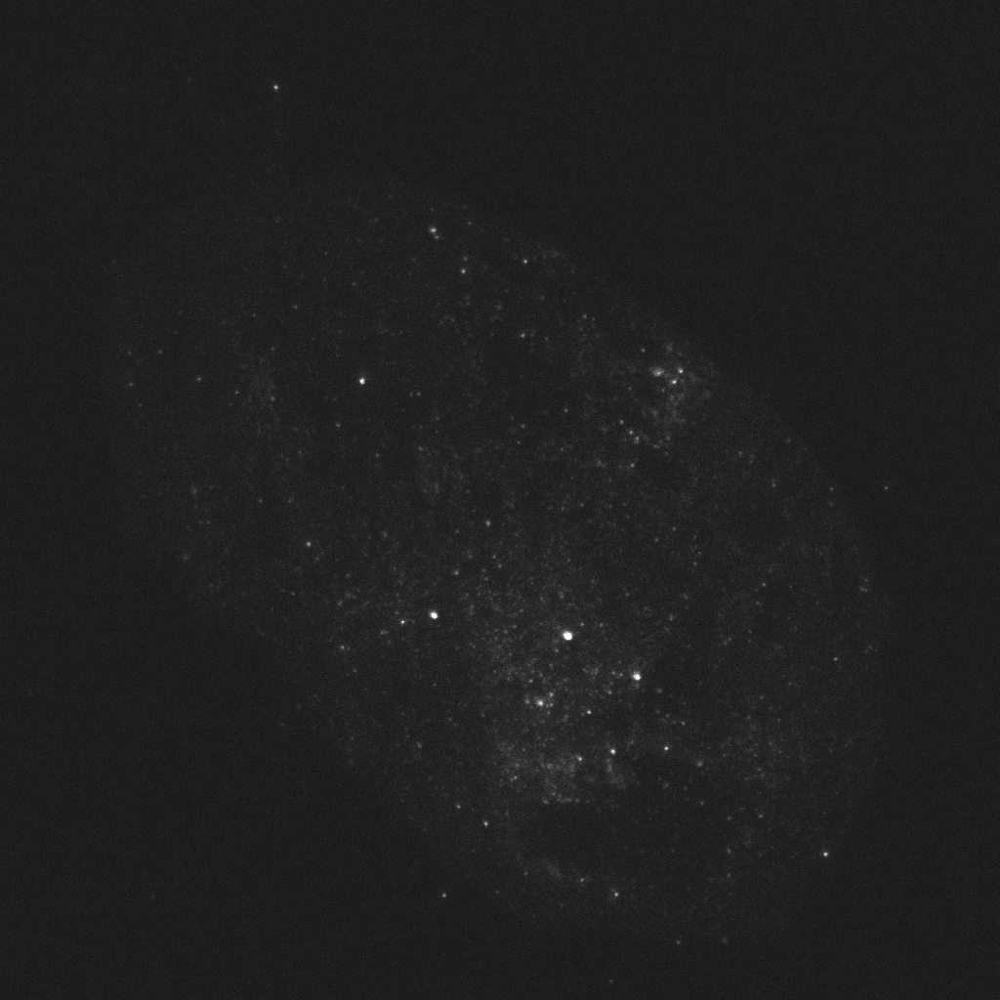
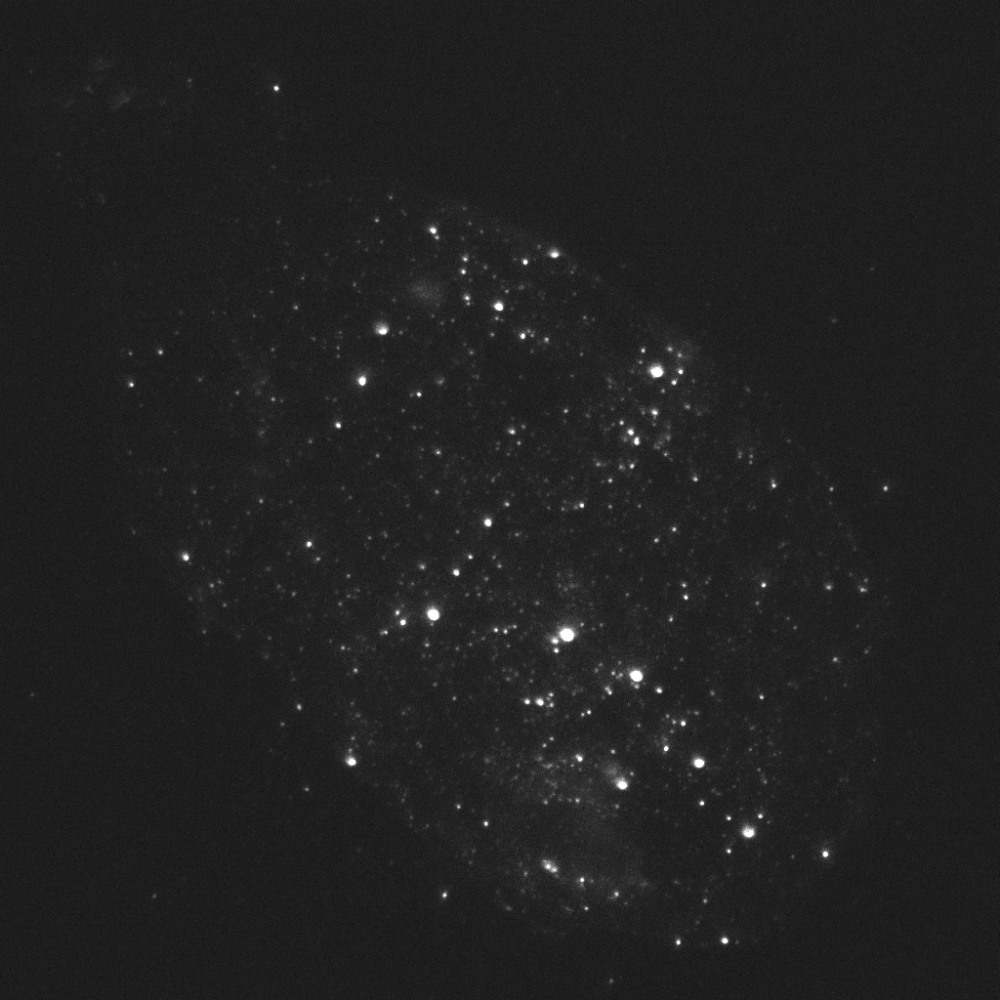
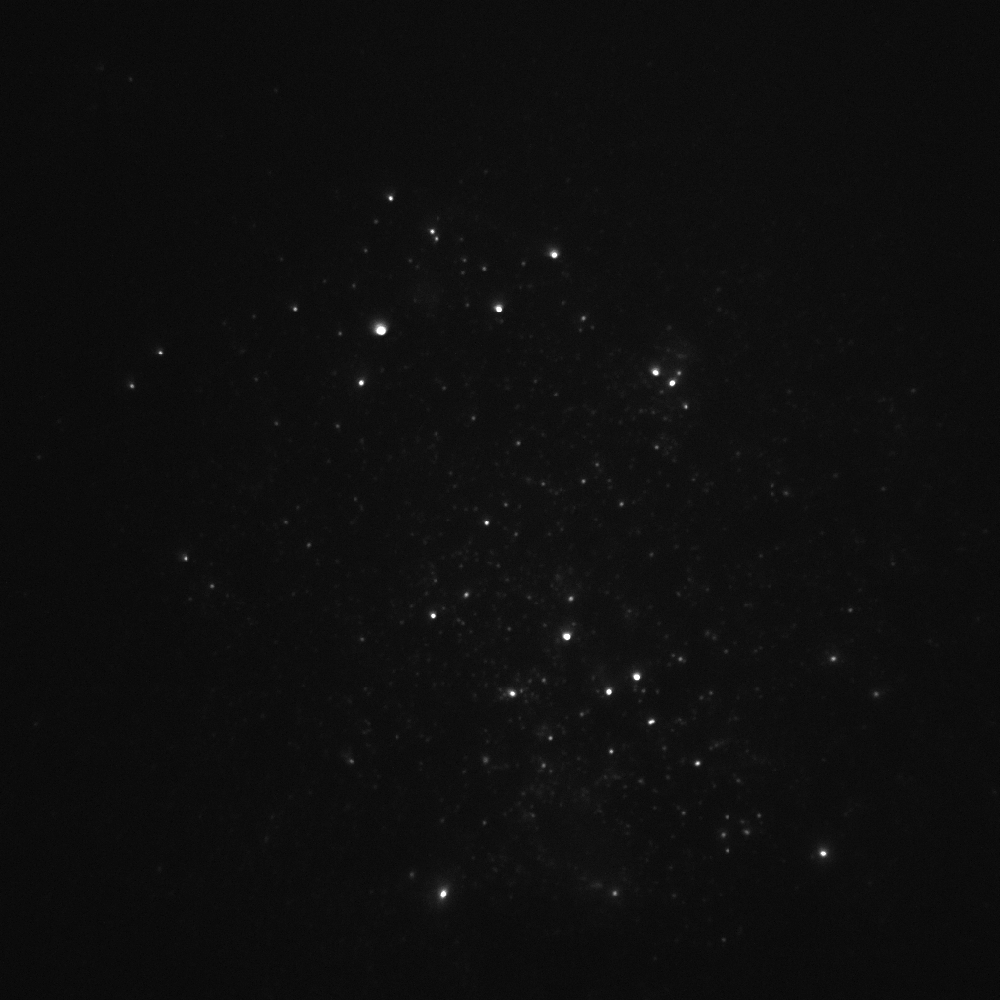

In [384]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default='notebook'

channel_images = [R_chan, G_chan, B_chan]
sensitivities = [170,190,170]
channel_names = ["Channel 1 (R)", 
                 "Channel 2 (G)", 
                 "Channel 3 (B)"]
detections = {channel_names[0]:0, 
               channel_names[1]:0, 
               channel_names[2]:0}
fig = make_subplots(rows=1,cols=3, shared_xaxes="all", 
                    shared_yaxes="all",
                    subplot_titles = (channel_names[0],
                                      channel_names[1],
                                      channel_names[2]))

for j, image in enumerate(channel_images):
    colors = ["#FF0000", "#00FF00", "#00BFFF"]

    ch_image = px.imshow(image,
                         color_continuous_scale='gray',
                         binary_string=True, binary_backend="jpg")

    fig = fig.add_trace(ch_image.data[0],
                       row=1, col=j+1)

    fig.update_layout(coloraxis_showscale=False)
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)

    mask, contours, hierarchy = extract_masks(image, sensitivities[j])
    detections[channel_names[j]] = len(contours)
    for i in range(len(contours)):

        contour_im = cv2.drawContours(deepcopy(mask) , contours, i, (255,0,0),-1, hierarchy=hierarchy, maxLevel = 0)

        contour_idx = np.where(contour_im.flatten()<250)
        noncontour_idx = np.where(contour_im.flatten()>250)

        cropped_mask = deepcopy(image.reshape(-1))
        cropped_mask[contour_idx] = 0 

        intensity = int(np.round(np.mean(cropped_mask[noncontour_idx])))
        area_px = len(cropped_mask[noncontour_idx])
        area_si = 'Unknown'

        cropped_mask = cropped_mask.reshape(size,size)

        x_con = contours[i].reshape(contours[i].shape[0],-1)[:,0]
        y_con = contours[i].reshape(contours[i].shape[0],-1)[:,1]
        area_si = "X"
        hoverinfo = f"Intensity: {intensity}/255<br>Area: {area_px} px | {area_si} μm²"
        fig.add_scatter(x=x_con, y=y_con, 
                        mode="lines",
                        fill="toself",
                        line=dict(color=colors[j]),
                        showlegend=False,
                        hovertemplate=hoverinfo,
                        hoveron="points+fills",
                        name=f"#{i+1}",
                        row=1, col=j+1
                       )
    fig.layout.annotations[j].update(y=0.9)
fig.for_each_annotation(lambda a: a.update(text = a.text + "    #Detections: "+str(detections[a.text])))
fig['layout'].update(height=image.shape[1]*0.8, 
                     width=image.shape[1]*1.7)

fig.show()

fig.write_html("file.html")